In [92]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pylab as plt
import matplotlib.colors as colors
import torchvision

import os
import time
import torch
import sys
import argparse
sys.path.insert(0, '../../shared_code')
from model_loader_func import * 
from dataloader_func import *
from quality_metrics_func import *
from linear_approx import *
from inverse_tasks_func import synthesis
from plotting_func import *
from algorithm_inv_prob import * 
from trainer import make_loader
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [93]:
print(torch.__version__)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
device

2.5.0+cu124


device(type='cuda')

# functions 

In [94]:
## plotting stuff: 
noise_colormap = plt.cm.copper 
scale_colormap = plt.cm.seismic


In [95]:
similarity_matrix = lambda data : data/data.norm(dim = 1, keepdim=True) @(data/data.norm(dim = 1, keepdim=True)).T
similarity_vactor = lambda data, v : (v/(v.norm(dim = 1, keepdim=True)+1e-6) @(data/(data.norm(dim = 1, keepdim=True) +1e-6 ) ).T).flatten()
similarity_matrix_2mats = lambda data1, data2 : data1/data1.norm(dim = 1, keepdim=True) @(data2/data2.norm(dim = 1, keepdim=True)).T

degree_matrix = lambda sim_mat : torch.diag(sim_mat.sum(dim = 1))

participation_ratio = lambda v :  (v.norm(1)**2)/v.norm(2)**2/len(v)
participation_ratio_dataset = lambda data :  (data.norm(1, dim = 1)**2)/data.norm(2,dim = 1)**2/data.shape[1]


# Load denoisers 

In [96]:
denoisers = {}

root_path = '/mnt/home/zkadkhodaie/ceph/22_representation_in_UNet_denoiser/denoisers/'

paths = { 
        'mixture-color-deep-no-skip-full':'UNet_flex/imagenet/0to255_RF_84x84_set_size_1281167_color_no_skip_deep_dec_full_64x64/',    

         'mixture-color-deep-no-skip-half_data1':'UNet_flex/imagenet/0to255_RF_84x84_set_size_640557_color_no_skip_deep_dec_half_data1_64x64/',    
         'mixture-color-deep-no-skip-half_data2':'UNet_flex/imagenet/0to255_RF_84x84_set_size_640610_color_no_skip_deep_dec_half_data2_64x64/',
    
        }

groups = paths.keys()


for group in groups: 
    path = root_path + paths[group]
    
    print('loading group ' , group )
    if 'modified' in group.split('-'):
        new_arch = 'UNet_conditional_mean_matching'
    else: 
        new_arch = None
    denoisers[group] = load_learned_model(path, print_args=True, new_arch=new_arch)
    start_time_total = time.time()        
    print("--- %s seconds ---" % (round(time.time() - start_time_total)))
     

loading group  mixture-color-deep-no-skip-full
*************** saved arguments:*************
arch_name UNet_flex
lr 0.001
batch_size 4096
num_epochs 2000
lr_freq 100
loss_weight False
noise_level_range [0, 255]
quadratic_noise True
rescale False
swap False
set_size 1281167
imagenet_subset_ids None
data_name imagenet
data_root_path /mnt/home/zkadkhodaie/ceph/datasets/
dir_name /mnt/home/zkadkhodaie/ceph/22_representation_in_UNet_denoiser/denoisers/UNet_flex/imagenet/0to255_RF_84x84_set_size_1281167_color_no_skip_deep_dec_full_64x64
optional_dir_label color_no_skip_deep_dec_full
device cuda
debug False
kernel_size 3
padding 1
skip False
num_channels 3
bias True
RF 84
coarse True
self_cond False
num_kernels [64, 128, 256, 512]
num_blocks 3
num_enc_conv [2, 2, 2]
num_mid_conv 3
num_dec_conv [6, 6, 6]
NormType LayerNorm
inter_skip True
dilations None
upsample_with_bias False
data_path /mnt/home/zkadkhodaie/ceph/datasets/imagenet
******************************************************
number 

In [97]:
denoisers.keys()


dict_keys(['mixture-color-deep-no-skip-full', 'mixture-color-deep-no-skip-half_data1', 'mixture-color-deep-no-skip-half_data2'])

In [98]:
layers = {}
for group in groups:
    layers[group] = []
    for i in range(len(denoisers[group].encoder)):
        layers[group].append(denoisers[group].encoder[str(i) ][0].weight.shape[0])
    
    layers[group].append(denoisers[group].mid[0].weight.shape[0])
    
    for i in range(len(denoisers[group].decoder)-1 , 0, -1):
        layers[group].append(denoisers[group].decoder[str(i) ][0].weight.shape[0])


layers

{'mixture-color-deep-no-skip-full': [64, 128, 256, 512, 256, 128],
 'mixture-color-deep-no-skip-half_data1': [64, 128, 256, 512, 256, 128],
 'mixture-color-deep-no-skip-half_data2': [64, 128, 256, 512, 256, 128]}

In [99]:
block_names = {}
for group in groups: 
    block_names[group] = []
    for l in range(int(len(layers[group])/2)): 
        block_names[group].append('enc' + str(l))
    block_names[group].append('mid'  )        
    for l in range(int(len(layers[group])/2)-1, 0,-1):
        block_names[group].append('dec' + str(l) )
block_names   

{'mixture-color-deep-no-skip-full': ['enc0',
  'enc1',
  'enc2',
  'mid',
  'dec2',
  'dec1'],
 'mixture-color-deep-no-skip-half_data1': ['enc0',
  'enc1',
  'enc2',
  'mid',
  'dec2',
  'dec1'],
 'mixture-color-deep-no-skip-half_data2': ['enc0',
  'enc1',
  'enc2',
  'mid',
  'dec2',
  'dec1']}

# Load datasets 

In [100]:
time0 = time.time()
test_sets = torch.load( '/mnt/home/zkadkhodaie/ceph/datasets/imagenet/validation_color_full_64x64_list.pt', weights_only=True) 
print(f"loading time: {time.time() - time0} seconds ")

loading time: 29.516374349594116 seconds 


In [101]:
half_data1 = [test_sets[i][0:int(len(test_sets[i])/2)] for i in range(len(test_sets))]            
half_data2 = [test_sets[i][int(len(test_sets[i])/2)::] for i in range(len(test_sets))]     


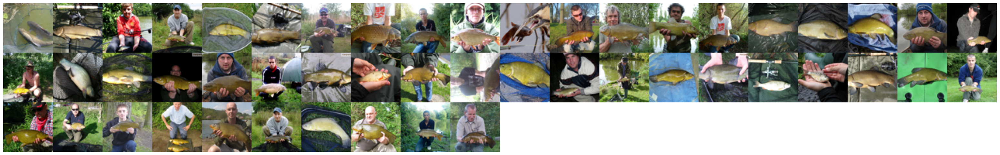

In [102]:
show_im_grid(test_sets[0], n_columns= 20 )


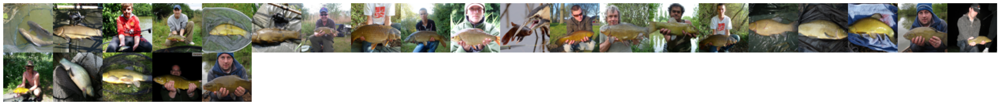

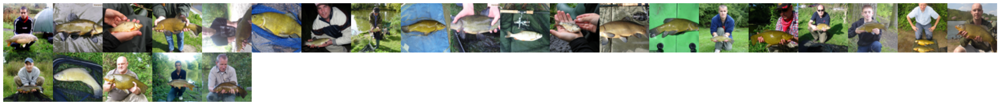

In [103]:
show_im_grid(half_data1[0], n_columns= 20 )
show_im_grid(half_data2[0], n_columns= 20 )


In [104]:
print('number of images in each class:', test_sets[0].shape)
K = test_sets[0].shape[2]
n_channels = test_sets[0].shape[1]
print(len(test_sets))

number of images in each class: torch.Size([50, 3, 64, 64])
1000


tensor(0.4424)


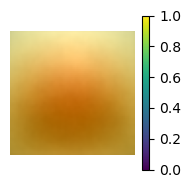

In [105]:
dist_mean = torch.concatenate(test_sets).mean(dim = (0))
plot_single_im(dist_mean, colorbar=True)
print(dist_mean.mean())

In [106]:
dist_mean.mean(dim = (1,2), keepdim = True)

tensor([[[0.4764]],

        [[0.4504]],

        [[0.4005]]])

In [107]:
test_sets_cat = torch.concatenate(test_sets)
test_sets_cat.shape

torch.Size([50000, 3, 64, 64])

# Compare denoising performance 

In [108]:
## compute psnr 

my_ims = torch.cat([test_sets[i][-1::] for i in range(len(test_sets)) ])

sig_range = torch.logspace(.0001,2.9,15)

psnr_test = {}
# psnr_train = {}
for group in groups: 

    ## train 
    print(group)
    if 'gray' in group.split('-'): 
        loader = DataLoader(dataset=my_ims.mean(dim =1, keepdim=True), batch_size=512, shuffle=False)
    else: 
        loader = DataLoader(dataset=my_ims, batch_size=512, shuffle=False)
            
    try: 
        psnr_test[group] = calc_psnr(denoisers[group],loader,sig_range, device, skip=False)
    except KeyError: 
        pass


mixture-color-deep-no-skip-full
mixture-color-deep-no-skip-half_data1
mixture-color-deep-no-skip-half_data2


mixture-color-deep-no-skip-full
mixture-color-deep-no-skip-half_data1
mixture-color-deep-no-skip-half_data2


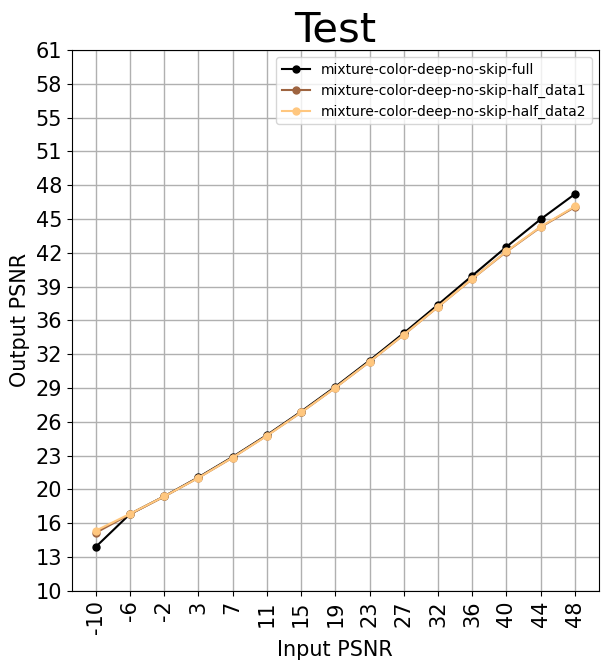

In [109]:
## plot 
f , axs = plt.subplots(1,1, figsize=(6,6), sharex = True, sharey=True)
plt.tight_layout()
x_axis = [ -10*np.log10( (float(std)/255)**2  ) for std in psnr_test[group].keys()]

for group in groups: 
    print(group)
    if 'color' in group.split('-'):
        ## test 
        axs.plot(x_axis, [psnr_test[group][key] for key in psnr_test[group].keys()], 
                    marker = '.',markersize = 10,label =  group , alpha = 1)

axs.set_xticks(x_axis);
axs.grid(  linewidth=1);
axs.set_xticklabels(np.round(x_axis).astype(int) ,rotation=90, fontsize=15)
# axs.set_xlim(-3, 45)

y_axis = np.linspace(10,61,17) 
axs.set_yticks(y_axis);
axs.set_yticklabels(np.round(y_axis).astype(int) , fontsize=15);
# axs.set_ylim(18, 45)


colormap = plt.cm.copper #nipy_spectral, Set1,Paired   
plot_colors = [colormap(i) for i in np.linspace(0, 1, len(groups) )]
for k,j in enumerate(axs.lines):
    j.set_color(plot_colors[k])
# axs.plot(x_axis, [ -10*np.log10( (std/255)**2  ) for std in sig_range/K ],linestyle = 'dotted', label = 
            # 'expected from 1d manifold(N=1)', color='gray')
# axs.plot( [0,48],[0,48] ,'k--', alpha = .7, label = 'identity');
axs.legend(fontsize = 10);
axs.set_title('Test', fontsize = 30)
axs.set_xlabel('Input PSNR', fontsize = 15)
axs.set_ylabel('Output PSNR', fontsize = 15);


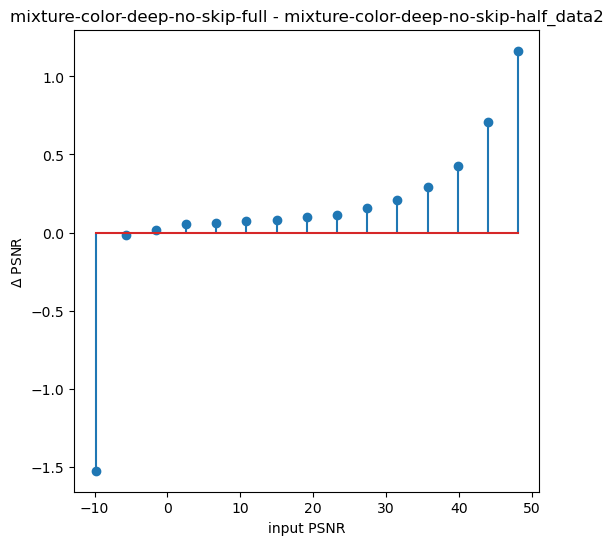

In [114]:
denoiser1 =  'mixture-color-deep-no-skip-full'
denoiser2 = 'mixture-color-deep-no-skip-half_data2'
f , axs = plt.subplots(1,1, figsize=(6,6), sharex = True, sharey=True)

axs.stem(x_axis,[psnr_test[denoiser1][key] - psnr_test[denoiser2][key] for key in psnr_test[group].keys()])
axs.set_xlabel('input PSNR')
axs.set_title(denoiser1+ ' - '+ denoiser2)
axs.set_ylabel('$\Delta$ PSNR');


# Synthesis

In [115]:

n_samples =30

seed = 1
freq =100
sig_L = .02
sig0 = 3
h0= .01
beta = .05

fixed_h =True
all_samples = {}
all_interm_Ys = {}
all_init = []
skip = True
start_time_total = time.time()

for group in groups: 
    if 'skip' in group.split('-'): 
        skip = False
    if seed is not None:
        torch.manual_seed(seed )
        

    
    print('--------- group : ', group)        
    all_samples[group] = {}
    all_interm_Ys[group] = {}            
    temp = []
    for i in range(1):    
        if 'color' in group.split('-'): 
            n_channels = 3
            init_im = torch.ones((n_samples,n_channels ,K,K) ,device = device )*.45+ torch.randn(n_samples,n_channels ,K,K, device = device)*sig0
            
        else: 
            n_channels = 1        
            init_im = dist_mean.mean(dim=0,keepdim=True).to(device)+ torch.randn(n_samples,n_channels ,K,K, device = device) * sig0

        
        sample, interm_Ys,sigs,means, ts = batch_synthesis(denoisers[group],
                                              init_im=init_im, 
                                              sig_L=sig_L, 
                                              h0=h0, 
                                              beta=beta, 
                                              freq=freq,
                                              device=device, 
                                              fixed_h = fixed_h,
                                              max_T=20000, 
                                              seed= seed , 
                                              skip = skip
                                              )
                    
        temp.append(sample.detach())    
    
    all_samples[group] = torch.cat(temp)
    all_interm_Ys[group] = interm_Ys
    
            
print("--- %s seconds ---" % (time.time() - start_time_total))

--------- group :  mixture-color-deep-no-skip-full
----------------------------- 100
sigma  2.385528087615967
mean  0.44635656476020813
----------------------------- 200
sigma  2.246155261993408
mean  0.43269145488739014
----------------------------- 300
sigma  2.119961977005005
mean  0.42259156703948975
----------------------------- 400
sigma  2.007131576538086
mean  0.41549918055534363
----------------------------- 500
sigma  1.885359525680542
mean  0.4137081801891327
----------------------------- 600
sigma  1.7742153406143188
mean  0.4039217233657837
----------------------------- 700
sigma  1.6784628629684448
mean  0.3963208496570587
----------------------------- 800
sigma  1.5812022686004639
mean  0.39061814546585083
----------------------------- 900
sigma  1.4892276525497437
mean  0.3898795247077942
----------------------------- 1000
sigma  1.4012619256973267
mean  0.38678839802742004
----------------------------- 1100
sigma  1.3197342157363892
mean  0.3878466784954071
-----------

fixed_h= True  sig_L=  0.02  h0= 0.01  beta= 0.05  seed= 2  sig_0= 3


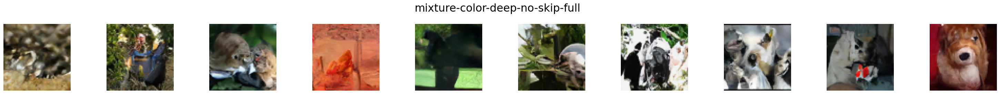

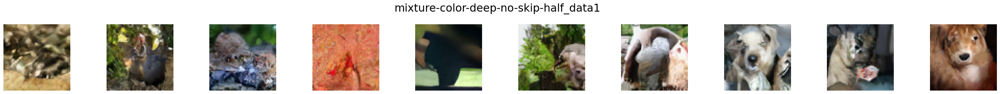

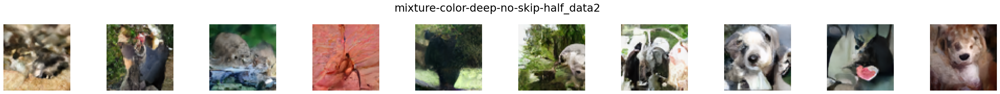

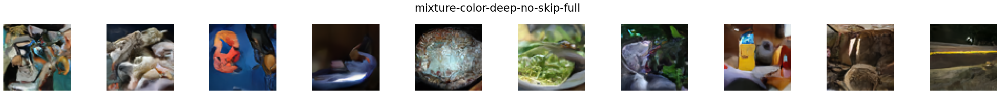

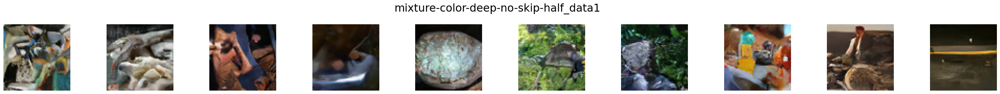

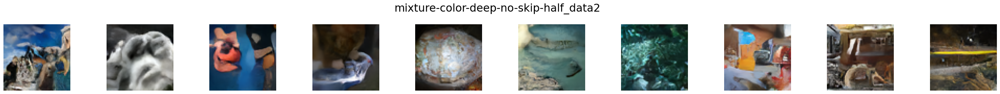

In [72]:
print('fixed_h=', fixed_h, ' sig_L= ',sig_L, ' h0=', h0, ' beta=',beta, ' seed=', seed, ' sig_0=', sig0)
for group in groups: 
    show_im_set(all_samples[group][0:10], n_columns=10, label=group, sub_labels=['']*10)
for group in groups: 
    show_im_set(all_samples[group][10:20], n_columns=10, label=group, sub_labels=['']*10)

fixed_h= True  sig_L=  0.02  h0= 0.01  beta= 0.05  seed= 0  sig_0= 3


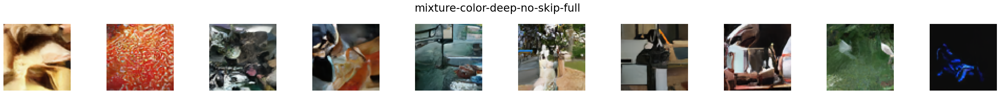

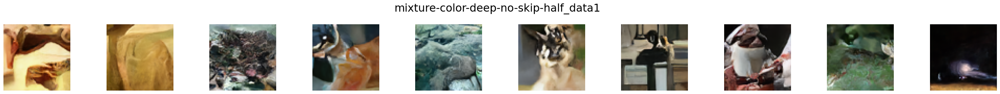

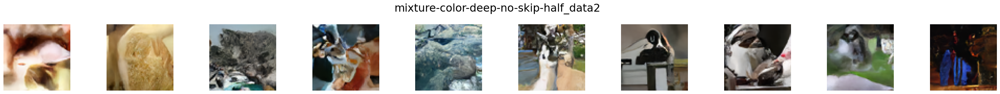

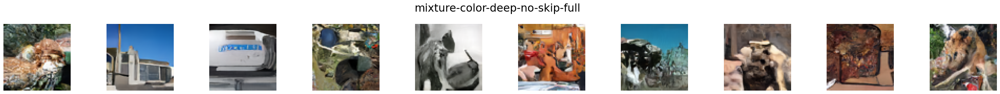

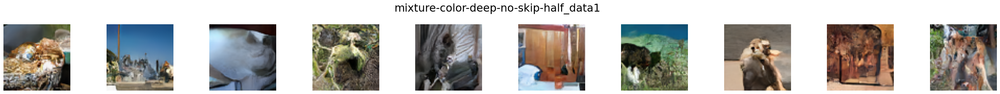

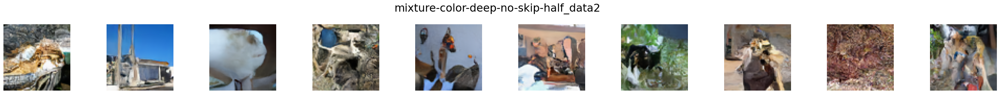

In [70]:
print('fixed_h=', fixed_h, ' sig_L= ',sig_L, ' h0=', h0, ' beta=',beta, ' seed=', seed, ' sig_0=', sig0)
for group in groups: 
    show_im_set(all_samples[group][0:10], n_columns=10, label=group, sub_labels=['']*10)
for group in groups: 
    show_im_set(all_samples[group][10:20], n_columns=10, label=group, sub_labels=['']*10)

fixed_h= True  sig_L=  0.02  h0= 0.01  beta= 0.05  seed= 1  sig_0= 3


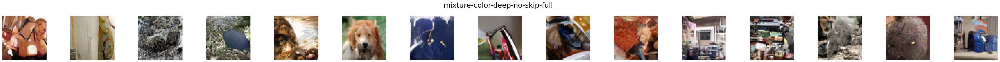

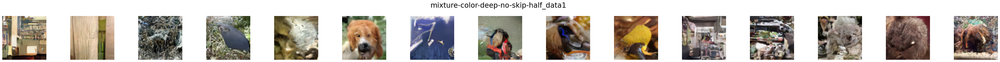

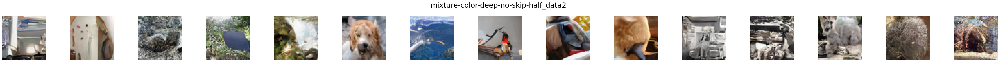

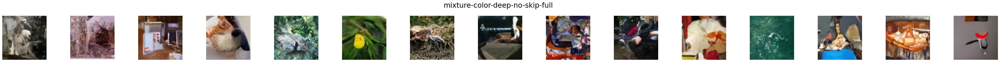

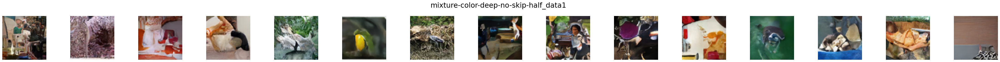

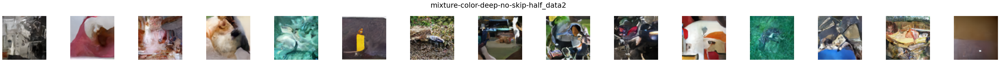

In [51]:
print('fixed_h=', fixed_h, ' sig_L= ',sig_L, ' h0=', h0, ' beta=',beta, ' seed=', seed, ' sig_0=', sig0)
for group in groups: 
    show_im_set(all_samples[group][0:15], n_columns=15, label=group, sub_labels=['']*15)
for group in groups: 
    show_im_set(all_samples[group][15:30], n_columns=15, label=group, sub_labels=['']*15)

fixed_h= True  sig_L=  0.02  h0= 0.01  beta= 0.05  seed= 1  sig_0= 3


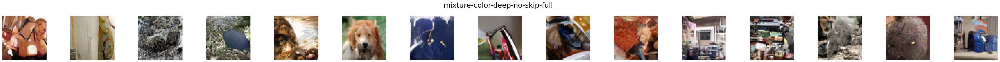

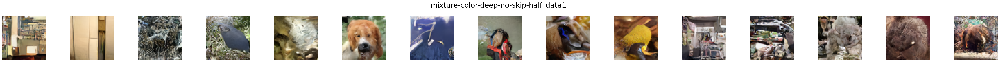

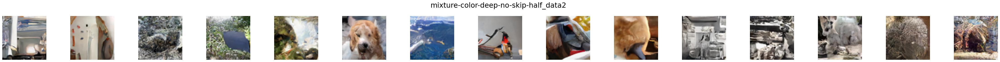

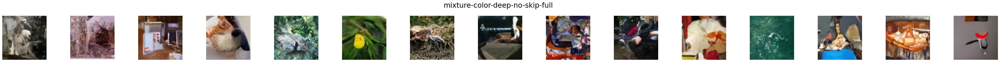

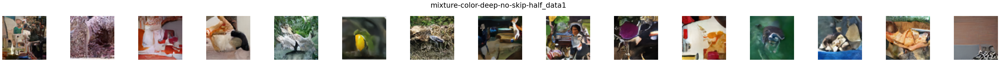

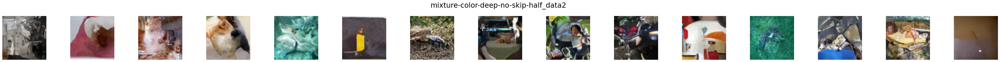

In [116]:
print('fixed_h=', fixed_h, ' sig_L= ',sig_L, ' h0=', h0, ' beta=',beta, ' seed=', seed, ' sig_0=', sig0)
for group in groups: 
    show_im_set(all_samples[group][0:15], n_columns=15, label=group, sub_labels=['']*15)
for group in groups: 
    show_im_set(all_samples[group][15:30], n_columns=15, label=group, sub_labels=['']*15)

fixed_h= True  sig_L=  0.02  h0= 0.01  beta= 0.1  seed= 1  sig_0= 3


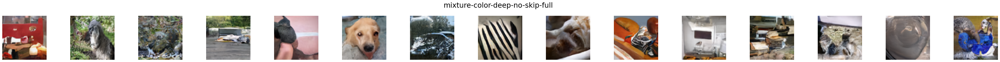

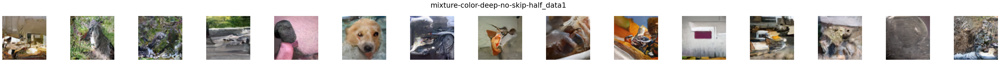

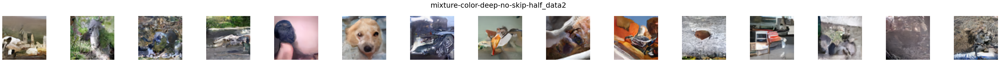

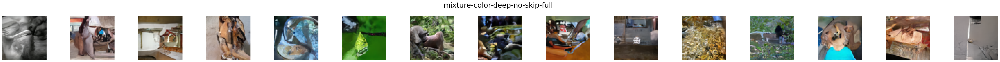

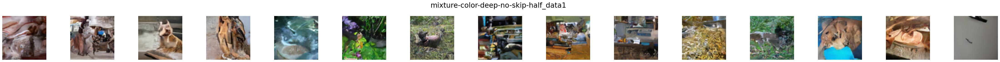

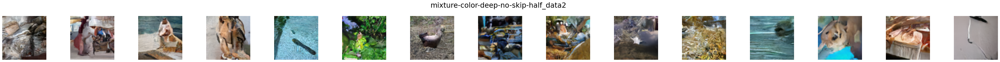

In [49]:
print('fixed_h=', fixed_h, ' sig_L= ',sig_L, ' h0=', h0, ' beta=',beta, ' seed=', seed, ' sig_0=', sig0)
for group in groups: 
    show_im_set(all_samples[group][0:15], n_columns=15, label=group, sub_labels=['']*15)
for group in groups: 
    show_im_set(all_samples[group][15:30], n_columns=15, label=group, sub_labels=['']*15)

fixed_h= True  sig_L=  0.02  h0= 0.01  beta= 1  seed= 1  sig_0= 3


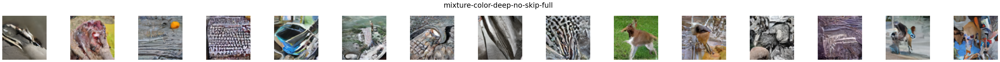

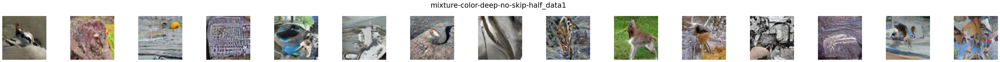

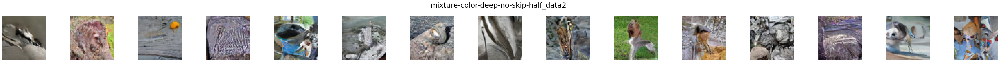

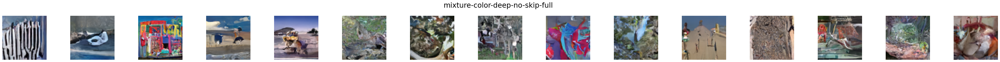

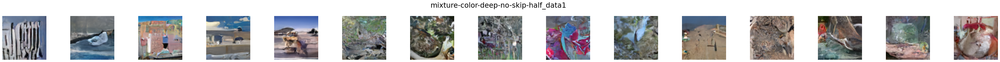

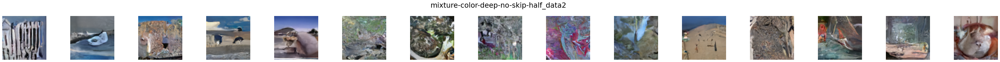

In [47]:
print('fixed_h=', fixed_h, ' sig_L= ',sig_L, ' h0=', h0, ' beta=',beta, ' seed=', seed, ' sig_0=', sig0)
for group in groups: 
    show_im_set(all_samples[group][0:15], n_columns=15, label=group, sub_labels=['']*15)
for group in groups: 
    show_im_set(all_samples[group][15:30], n_columns=15, label=group, sub_labels=['']*15)

fixed_h= True  sig_L=  0.02  h0= 0.01  beta= 1  seed= 1


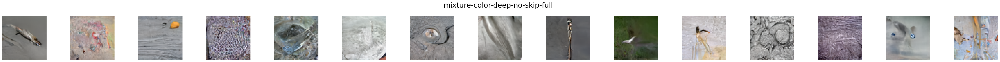

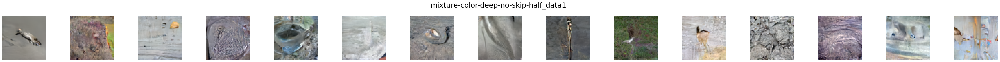

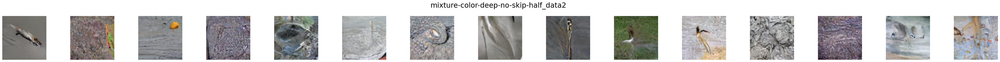

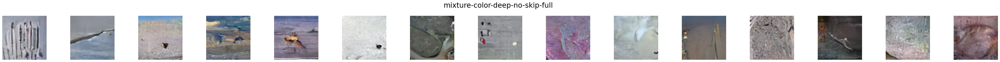

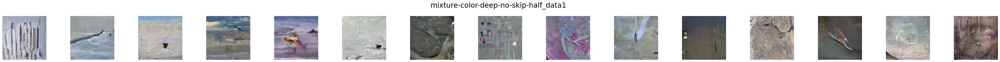

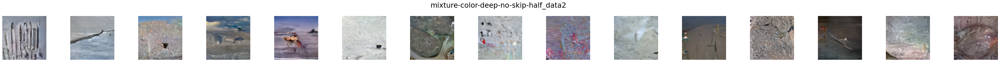

In [45]:
print('fixed_h=', fixed_h, ' sig_L= ',sig_L, ' h0=', h0, ' beta=',beta, ' seed=', seed, ' sig_0=', sig0)
for group in groups: 
    show_im_set(all_samples[group][0:15], n_columns=15, label=group, sub_labels=['']*15)
for group in groups: 
    show_im_set(all_samples[group][15:30], n_columns=15, label=group, sub_labels=['']*15)